In [1]:
import os
os.environ["CUDA_VISIBLE_DEVICES"]="1"

In [2]:
import numpy as np
import torch
import scanpy as sc
import muon as mu
import anndata
import mudata
import pandas as pd
import seaborn as sns

In [3]:
%load_ext autoreload
%autoreload 2

In [16]:
from src.vae.model import VAE, VAEB
from src.model import ModelParams
from src.types import TrainParams
from src.vae.dataloader import setup_batch_key
from src.vae.train import train_vae
from src.vae.diagnostics import plot_embedding, plot_embedding_vaeb

In [6]:
DATA_DIR = "/media/yob/nacho_stuff/prostate_cancer/Integration/MVAE-PoE/OtF-prostate/data/"
mdata = mu.read(DATA_DIR + "mdata_preprocessed_final_filtered.h5mu")
metadata = mu.read('/media/yob/nacho_stuff/prostate_cancer/Integration/MVAE-PoE/OtF-prostate/data/mdata_metadata.h5mu')
mdata.obs["new_ann"] = metadata.obs["new_ann"]
mdata.mod["msi"].obs["new_ann"] = metadata.obs["new_ann"]
mdata.mod["rna"].obs["new_ann"] = metadata.obs["new_ann"]

In [7]:
msi = mdata["msi"]
msi

AnnData object with n_obs × n_vars = 42475 × 12510
    obs: 'ST_barcode', 'sample', 'tissue', 'patient', 'ann', 'imagerow', 'imagecol', 'new_ann'
    obsm: 'spatial'

# Without LISI loss (vanilla VAE, total loss = MSE)

In [11]:
from src.vae.model import VAE
from src.model import ModelParams

model_params = ModelParams(beta=0.01, n_layers=2, z_dim=100, n_hidden=300, use_cuda=True)

In [7]:
from src.types import TrainParams
train_params = TrainParams(train_size=0.8, n_epochs=100, learning_rate=1e-4, batch_size=128, 
                           add_lisi_loss=False, params_file="vae_params_no_lisi")

In [ ]:
torch.set_num_threads(16)
model_no_lisi = VAE(mdata["msi"].copy(), model_params)

# Training:

# from src.vae.train import train_vae
# hist = train_vae(model, msi, train_params)

In [12]:
# Load state
model_dict = torch.load('mvae_params/vae_params_no_lisi_20230319-171734.pt', map_location='cuda')
model_no_lisi.load_state_dict(model_dict)

<All keys matched successfully>

## Diagnostics

100%|██████████████████████████████████████████████████████████████████████████| 332/332 [00:11<00:00, 27.80it/s]
/media/gambino/students_workdir/anna/miniconda3/envs/ak/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/media/gambino/students_workdir/anna/miniconda3/envs/ak/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/media/gambino/students_workdir/anna/miniconda3/envs/ak/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/media/gambino/students_workdir/anna/miniconda3/envs/ak/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c

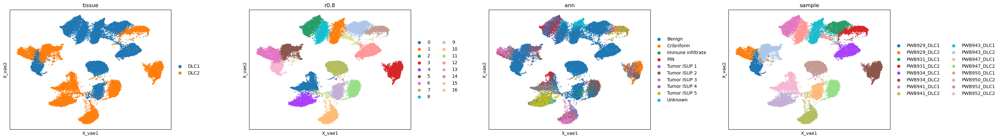

In [14]:
from src.vae.diagnostics import plot_embedding
plot_embedding(model_no_lisi, msi, train_params)

In [15]:
from src.vae.diagnostics import classification_performance

# Random Forest Classification
classification_performance(model_no_lisi, msi, "ann", train_params)

0.7447385317828351

In [16]:
from src.vae.diagnostics import batch_integration

# Mean LISI value across cells, LISI =~ from how many different batches a cell has neighbors
batch_integration(model_no_lisi, msi, train_params)

100%|██████████████████████████████████████████████████████████████████████████| 332/332 [00:16<00:00, 20.70it/s]


tensor(1.1285, device='cuda:0')

# With LISI loss (total loss = MSE + 1/mean(LISI))

In [18]:
from src.types import TrainParams
lisi_params = TrainParams(train_size=0.8, n_epochs=100, learning_rate=1e-4, batch_size=128, params_file="vae_lisi")

In [19]:
from src.vae.model import VAE
from src.model import ModelParams

model_params = ModelParams(beta=0.01, n_layers=2, z_dim=100, n_hidden=300, use_cuda=True)
torch.set_num_threads(16)
msi = mdata["msi"].copy()

model_lisi = VAE(msi, model_params)
model_lisi

VAE(
  (sampling): SamplingLayers(
    (mean): Sequential(
      (0): Linear(in_features=300, out_features=100, bias=True)
      (1): Dropout(p=0.3, inplace=False)
    )
    (logvar): Sequential(
      (0): Linear(in_features=300, out_features=100, bias=True)
      (1): Dropout(p=0.3, inplace=False)
    )
  )
  (encoder): FullyConnectedLayers(
    (layers): Sequential(
      (0): Sequential(
        (0): Linear(in_features=12510, out_features=300, bias=True)
        (1): BatchNorm1d(300, eps=0.001, momentum=0.01, affine=True, track_running_stats=True)
        (2): ReLU()
        (3): Dropout(p=0.1, inplace=False)
      )
      (1): Sequential(
        (0): Linear(in_features=300, out_features=300, bias=True)
        (1): BatchNorm1d(300, eps=0.001, momentum=0.01, affine=True, track_running_stats=True)
        (2): ReLU()
        (3): Dropout(p=0.1, inplace=False)
      )
    )
  )
  (decoder): FullyConnectedLayers(
    (layers): Sequential(
      (0): Sequential(
        (0): Linear(in

In [21]:
# Training

# from src.vae.train import train_vae
# hist = train_vae(model, msi, lisi_params)

# Load state
model_dict = torch.load('mvae_params/vae_lisi_20230319-230753.pt', map_location='cuda')
model_lisi.load_state_dict(model_dict)

<All keys matched successfully>

## Diagnostics

100%|██████████████████████████████████████████████████████████████████████████| 332/332 [00:16<00:00, 20.33it/s]
/media/gambino/students_workdir/anna/miniconda3/envs/ak/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/media/gambino/students_workdir/anna/miniconda3/envs/ak/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/media/gambino/students_workdir/anna/miniconda3/envs/ak/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/media/gambino/students_workdir/anna/miniconda3/envs/ak/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c

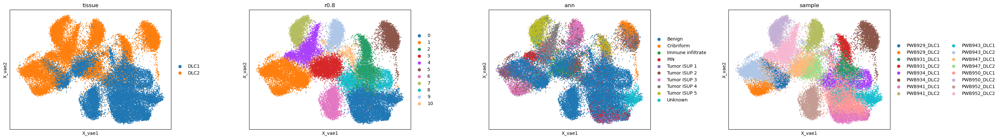

In [22]:
plot_embedding(model_lisi, msi, train_params)

In [23]:
# Random Forest Classification
score, rfc = classification_performance(model_lisi, msi, "ann", train_params)
score

0.6895198687308268

In [24]:
batch_integration(model_lisi, msi, train_params)

100%|██████████████████████████████████████████████████████████████████████████| 332/332 [00:16<00:00, 20.70it/s]


tensor(1.9593, device='cuda:0')

# With LISI loss (total loss = MSE + N/mean(LISI^2))

In [27]:
from src.types import TrainParams
lisi_params = TrainParams(train_size=0.8, n_epochs=100, learning_rate=1e-4, batch_size=128, 
                          add_lisi_loss=True, params_file="vae_lisi_pow2")

In [26]:
from src.vae.model import VAE
from src.model import ModelParams

model_params = ModelParams(beta=0.01, n_layers=2, z_dim=100, n_hidden=300, use_cuda=True)
torch.set_num_threads(16)
msi = mdata["msi"].copy()

model_lisi_pow2 = VAE(msi, model_params)

In [32]:
# from src.vae.train import train_vae
# hist = train_vae(model_lisi_pow2, msi, lisi_params)

# Load state
model_dict = torch.load('mvae_params/vae_lisi_pow2_20230321-162732.pt', map_location='cuda')
model_lisi_pow2.load_state_dict(model_dict)

<All keys matched successfully>

100%|██████████████████████████████████████████████████████████████████████████| 332/332 [00:16<00:00, 20.18it/s]
/media/gambino/students_workdir/anna/miniconda3/envs/ak/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/media/gambino/students_workdir/anna/miniconda3/envs/ak/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/media/gambino/students_workdir/anna/miniconda3/envs/ak/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/media/gambino/students_workdir/anna/miniconda3/envs/ak/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c

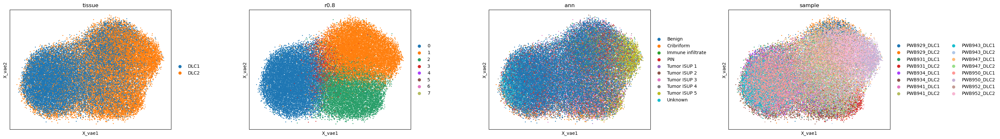

In [33]:
plot_embedding(model_lisi_pow2, msi, lisi_params)

In [34]:
score, rfc = classification_performance(model_lisi_pow2, msi, "ann", lisi_params)
score

0.47898979810230435

In [35]:
batch_integration(model_lisi_pow2, msi, lisi_params)

100%|██████████████████████████████████████████████████████████████████████████| 332/332 [00:16<00:00, 20.46it/s]


tensor(3.8472, device='cuda:0')

# With LISI loss (total loss = MSE + 1/mean(LISI^2))

In [46]:
from src.types import TrainParams
lisi_params = TrainParams(train_size=0.8, n_epochs=100, learning_rate=1e-4, batch_size=128, 
                          add_lisi_loss=True, params_file="vae_lisi_1_pow2")

In [42]:
from src.vae.model import VAE
from src.model import ModelParams

model_params = ModelParams(beta=0.01, n_layers=2, z_dim=100, n_hidden=300, use_cuda=True)
torch.set_num_threads(16)
msi = mdata["msi"].copy()

model_lisi_1_pow2 = VAE(msi, model_params)

In [43]:
# from src.vae.train import train_vae
# hist = train_vae(model_lisi_1_pow2, msi, lisi_params)

model_dict = torch.load('mvae_params/vae_lisi_1_pow2_20230321-172258.pt', map_location='cuda')
model_lisi_1_pow2.load_state_dict(model_dict)

<All keys matched successfully>

100%|██████████████████████████████████████████████████████████████████████████| 332/332 [00:16<00:00, 19.98it/s]
/media/gambino/students_workdir/anna/miniconda3/envs/ak/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/media/gambino/students_workdir/anna/miniconda3/envs/ak/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/media/gambino/students_workdir/anna/miniconda3/envs/ak/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/media/gambino/students_workdir/anna/miniconda3/envs/ak/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c

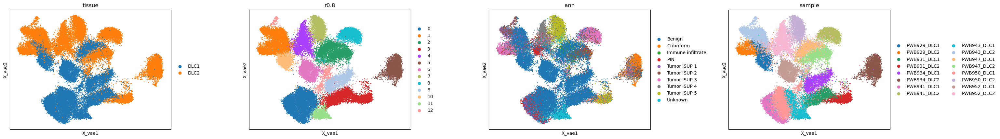

In [47]:
plot_embedding(model_lisi_1_pow2, msi, lisi_params)

In [45]:
score, rfc = classification_performance(model_lisi_1_pow2, msi, "ann", lisi_params)
score

0.7097096382963545

In [48]:
batch_integration(model_lisi_1_pow2, msi, lisi_params)

100%|██████████████████████████████████████████████████████████████████████████| 332/332 [00:16<00:00, 20.71it/s]


tensor(1.5659, device='cuda:0')

# With LISI loss (total loss = MSE + 1/mean(LISI^2), k-nn with k=3 * 50)

In [6]:
from src.types import TrainParams
lisi_params = TrainParams(train_size=0.8, n_epochs=100, learning_rate=1e-4, batch_size=128, 
                          add_lisi_loss=True, params_file="vae_lisi_3batch")

In [27]:
from src.vae.model import VAE
from src.model import ModelParams

model_params = ModelParams(beta=0.01, n_layers=2, z_dim=100, n_hidden=300, use_cuda=True)
torch.set_num_threads(16)
msi = mdata["msi"].copy()

model_lisi_batch = VAE(msi, model_params)

In [28]:
from src.vae.train import train_vae
hist = train_vae(model_lisi_batch, msi, lisi_params)


/media/gambino/students_workdir/anna/OtF-prostate/src/vae/dataloader.py:49: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs[BATCH_KEY] = pd.Categorical(
/media/gambino/students_workdir/anna/OtF-prostate/src/vae/dataloader.py:49: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs[BATCH_KEY] = pd.Categorical(
100%|██████████████████████████████████████████████████████████████████████████| 266/266 [01:59<00:00,  2.22it/s]

EarlyStopping (epoch: 1): train loss improved to 0.015846394845287264



100%|████████████████████████████████████████████████████████████████████████████| 67/67 [00:24<00:00,  2.73it/s]

EarlyStopping (epoch: 1): valid loss improved to 0.9819443955350278



100%|██████████████████████████████████████████████████████████████████████████| 266/266 [01:55<00:00,  2.31it/s]

EarlyStopping (epoch: 2): train loss improved to 0.005767311105803927



100%|████████████████████████████████████████████████████████████████████████████| 67/67 [00:25<00:00,  2.66it/s]

EarlyStopping (epoch: 2): valid loss improved to 0.7033666826006192



100%|████████████████████████████████████████████████████████████████████████████| 67/67 [00:25<00:00,  2.59it/s]

EarlyStopping (epoch: 3): valid loss improved to 0.6012641502850091



100%|████████████████████████████████████████████████████████████████████████████| 67/67 [00:25<00:00,  2.59it/s]

EarlyStopping (epoch: 4): valid loss improved to 0.5331897530982743



100%|████████████████████████████████████████████████████████████████████████████| 67/67 [00:26<00:00,  2.56it/s]

EarlyStopping (epoch: 5): valid loss improved to 0.5017326416364357



100%|████████████████████████████████████████████████████████████████████████████| 67/67 [00:25<00:00,  2.59it/s]

EarlyStopping (epoch: 6): valid loss improved to 0.4841827296498996



100%|████████████████████████████████████████████████████████████████████████████| 67/67 [00:26<00:00,  2.56it/s]

EarlyStopping (epoch: 7): valid loss improved to 0.4723384380340576



100%|████████████████████████████████████████████████████████████████████████████| 67/67 [00:26<00:00,  2.54it/s]

EarlyStopping (epoch: 9): valid loss improved to 0.45680055956342325



100%|████████████████████████████████████████████████████████████████████████████| 67/67 [00:26<00:00,  2.53it/s]

EarlyStopping (epoch: 11): valid loss improved to 0.4421002006352837



100%|██████████████████████████████████████████████████████████████████████████| 266/266 [02:02<00:00,  2.17it/s]

EarlyStopping (epoch: 12): train loss hasn't improved: 0.0036637534212546883. Stopping.



100%|██████████████████████████████████████████████████████████████████████████| 266/266 [02:01<00:00,  2.18it/s]

EarlyStopping (epoch: 13): train loss hasn't improved: 0.0036360335383364703. Stopping.



100%|██████████████████████████████████████████████████████████████████████████| 266/266 [02:02<00:00,  2.18it/s]

EarlyStopping (epoch: 14): train loss hasn't improved: 0.003611543129969513. Stopping.



100%|██████████████████████████████████████████████████████████████████████████| 266/266 [02:01<00:00,  2.19it/s]

EarlyStopping (epoch: 15): train loss hasn't improved: 0.003596902152346891. Stopping.



100%|██████████████████████████████████████████████████████████████████████████| 266/266 [02:01<00:00,  2.19it/s]

EarlyStopping (epoch: 16): train loss hasn't improved: 0.003580052520051432. Stopping.



100%|██████████████████████████████████████████████████████████████████████████| 266/266 [02:01<00:00,  2.18it/s]

EarlyStopping (epoch: 17): train loss hasn't improved: 0.0035604593892740177. Stopping.



100%|████████████████████████████████████████████████████████████████████████████| 67/67 [00:26<00:00,  2.53it/s]

EarlyStopping (epoch: 17): valid loss improved to 0.4308665221306815



100%|██████████████████████████████████████████████████████████████████████████| 266/266 [02:02<00:00,  2.18it/s]

EarlyStopping (epoch: 18): train loss hasn't improved: 0.0035502025499071633. Stopping.



100%|██████████████████████████████████████████████████████████████████████████| 266/266 [02:01<00:00,  2.18it/s]

EarlyStopping (epoch: 19): train loss hasn't improved: 0.003542695981639494. Stopping.



100%|██████████████████████████████████████████████████████████████████████████| 266/266 [02:03<00:00,  2.15it/s]

EarlyStopping (epoch: 20): train loss hasn't improved: 0.003531678488424345. Stopping.



100%|██████████████████████████████████████████████████████████████████████████| 266/266 [02:02<00:00,  2.17it/s]

EarlyStopping (epoch: 21): train loss hasn't improved: 0.003527223513959926. Stopping.



100%|██████████████████████████████████████████████████████████████████████████| 266/266 [02:02<00:00,  2.18it/s]

EarlyStopping (epoch: 22): train loss hasn't improved: 0.003513198833980583. Stopping.



100%|██████████████████████████████████████████████████████████████████████████| 266/266 [02:01<00:00,  2.19it/s]

EarlyStopping (epoch: 23): train loss hasn't improved: 0.0035101817566693147. Stopping.



100%|██████████████████████████████████████████████████████████████████████████| 266/266 [02:02<00:00,  2.17it/s]

EarlyStopping (epoch: 24): train loss hasn't improved: 0.0035054859824219897. Stopping.



100%|██████████████████████████████████████████████████████████████████████████| 266/266 [02:01<00:00,  2.18it/s]

EarlyStopping (epoch: 25): train loss hasn't improved: 0.00350014524311792. Stopping.



100%|████████████████████████████████████████████████████████████████████████████| 67/67 [00:26<00:00,  2.57it/s]

EarlyStopping (epoch: 25): valid loss improved to 0.4200441152302187



100%|██████████████████████████████████████████████████████████████████████████| 266/266 [02:02<00:00,  2.17it/s]

EarlyStopping (epoch: 26): train loss hasn't improved: 0.00349244180411153. Stopping.



 49%|████████████████████████████████████▍                                     | 131/266 [01:00<01:01,  2.21it/s]IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

100%|██████████████████████████████████████████████████████████████████████████| 266/266 [02:02<00:00,  2.17it/s]

EarlyStopping (epoch: 34): train loss hasn't improved: 0.003469619472423955. Stopping.



100%|██████████████████████████████████████████████████████████████████████████| 266/266 [02:02<00:00,  2.17it/s]

EarlyStopping (epoch: 35): train loss hasn't improved: 0.0034708187168243703. Stopping.



100%|████████████████████████████████████████████████████████████████████████████| 67/67 [00:26<00:00,  2.56it/s]

EarlyStopping (epoch: 35): valid loss hasn't improved: 0.41891161986251374. Stopping.


100%|██████████████████████████████████████████████████████████████████████████| 332/332 [00:12<00:00, 25.96it/s]
/media/gambino/students_workdir/anna/miniconda3/envs/ak/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/media/gambino/students_workdir/anna/miniconda3/envs/ak/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/media/gambino/students_workdir/anna/miniconda3/envs/ak/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/media/gambino/students_workdir/anna/miniconda3/envs/ak/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c

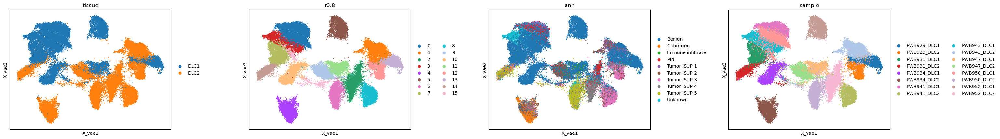

In [30]:
from src.vae.diagnostics import plot_embedding

plot_embedding(model_lisi_batch, msi, lisi_params)

In [31]:
from src.vae.diagnostics import classification_performance

classification_performance(model_lisi_batch, msi, "ann", lisi_params)

(0.7276164657201969, RandomForestClassifier())

In [34]:
from src.vae.diagnostics import batch_integration

# for comparison with previous models, here LISI is run again with K=3*30, not K=3*50
batch_integration(model_lisi_batch, msi, lisi_params)

100%|██████████████████████████████████████████████████████████████████████████| 332/332 [00:16<00:00, 19.98it/s]


tensor(1.3608, device='cuda:0')

# loss = MSE + 0.1 * sum(1/LISI)

train loss:
sum(1/LISI) ~ 1.6-1.8
MSE ~ 1-4

In [7]:
from src.types import TrainParams
train_params = TrainParams(train_size=0.8, n_epochs=100, learning_rate=1e-4, batch_size=128, 
                           add_lisi_loss=True, params_file="vae_params_lisi_0.1")

In [9]:
from src.vae.model import VAE
from src.model import ModelParams

model_params = ModelParams(beta=0.01, n_layers=2, z_dim=100, n_hidden=300, use_cuda=True)
torch.set_num_threads(16)
model_lisi_0_1 = VAE(msi, model_params)

In [10]:
from src.vae.train import train_vae
hist = train_vae(model_lisi_0_1, msi, train_params)

/media/gambino/students_workdir/anna/OtF-prostate/src/vae/dataloader.py:49: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs[BATCH_KEY] = pd.Categorical(
/media/gambino/students_workdir/anna/OtF-prostate/src/vae/dataloader.py:49: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs[BATCH_KEY] = pd.Categorical(
100%|█████████████████████████████████████████| 266/266 [02:08<00:00,  2.06it/s]

EarlyStopping (epoch: 1): train loss improved to 0.029808845163584455



100%|███████████████████████████████████████████| 67/67 [00:27<00:00,  2.39it/s]

EarlyStopping (epoch: 1): valid loss improved to 3.780950667253181



100%|███████████████████████████████████████████| 67/67 [00:28<00:00,  2.36it/s]

EarlyStopping (epoch: 2): valid loss improved to 2.6640756984255205



100%|█████████████████████████████████████████| 266/266 [02:08<00:00,  2.08it/s]

EarlyStopping (epoch: 3): train loss improved to 0.019520781214199326



100%|███████████████████████████████████████████| 67/67 [00:29<00:00,  2.28it/s]

EarlyStopping (epoch: 4): valid loss improved to 2.6203666694128693



100%|█████████████████████████████████████████| 266/266 [02:09<00:00,  2.05it/s]

EarlyStopping (epoch: 13): train loss hasn't improved: 0.018475474446152433. Stopping.



100%|█████████████████████████████████████████| 266/266 [02:09<00:00,  2.06it/s]

EarlyStopping (epoch: 14): train loss hasn't improved: 0.018482410949843993. Stopping.



100%|███████████████████████████████████████████| 67/67 [00:28<00:00,  2.31it/s]

EarlyStopping (epoch: 14): valid loss hasn't improved: 2.6428827367611785. Stopping.


100%|█████████████████████████████████████████| 332/332 [00:12<00:00, 25.67it/s]
/media/gambino/students_workdir/anna/miniconda3/envs/ak/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/media/gambino/students_workdir/anna/miniconda3/envs/ak/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/media/gambino/students_workdir/anna/miniconda3/envs/ak/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/media/gambino/students_workdir/anna/miniconda3/envs/ak/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be igno

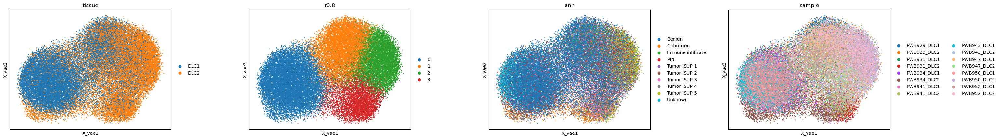

In [11]:
from src.vae.diagnostics import plot_embedding

plot_embedding(model_lisi_0_1, msi, train_params)

# loss = MSE + 0.05 * sum(1/LISI)

In [7]:
from src.types import TrainParams
from src.vae.model import VAE, ModelParams

train_params = TrainParams(train_size=0.8, n_epochs=100, learning_rate=1e-4, batch_size=128, 
                           add_lisi_loss=True, params_file="vae_params_lisi_0.05")

model_params = ModelParams(beta=0.01, gamma=0.001, n_layers=2, z_dim=100, n_hidden=300, use_cuda=True)
torch.set_num_threads(16)
model = VAE(msi, model_params)

In [8]:
from src.vae.train import train_vae
# hist = train_vae(model, msi, params=train_params)
model.load_state_dict(torch.load('vae_params/vae_params_lisi_0.05_20230519-195744.pt', map_location='cuda'))

<All keys matched successfully>

100%|█████████████████████████████████████████| 332/332 [00:16<00:00, 19.60it/s]
/media/gambino/students_workdir/anna/miniconda3/envs/ak/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/media/gambino/students_workdir/anna/miniconda3/envs/ak/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/media/gambino/students_workdir/anna/miniconda3/envs/ak/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


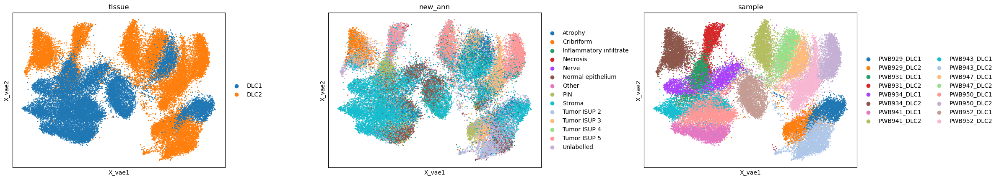

In [10]:
from src.vae.diagnostics import plot_embedding

plot_embedding(model, msi, train_params=train_params)

In [23]:
## VAEB
train_params = TrainParams(train_size=0.8, test_patience=100, n_epochs=100, learning_rate=1e-4, batch_size=128, 
                           add_lisi_loss=False, params_file="vae_params_vaeb")

model_params = ModelParams(beta=0.01, n_layers=2, z_dim=100, n_hidden=300, use_cuda=True)
torch.set_num_threads(16)
setup_batch_key(msi, ["sample"])
model = VAEB(msi, model_params)

In [24]:
hist = train_vae(model, msi, params=train_params)

/media/gambino/students_workdir/anna/miniconda3/envs/ak/lib/python3.9/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value
/media/gambino/students_workdir/anna/miniconda3/envs/ak/lib/python3.9/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value
100%|█████████████████████████████████████████| 266/266 [00:16<00:00, 16.15it/s]

EarlyStopping (epoch: 1): train loss improved to 0.015294740437198345



100%|███████████████████████████████████████████| 67/67 [00:05<00:00, 11.88it/s]

EarlyStopping (epoch: 1): valid loss improved to 0.8137806191373227



100%|███████████████████████████████████████████| 67/67 [00:05<00:00, 11.65it/s]

EarlyStopping (epoch: 2): valid loss improved to 0.7131896873018635



100%|█████████████████████████████████████████| 266/266 [00:17<00:00, 15.08it/s]

EarlyStopping (epoch: 3): train loss improved to 0.004695725646209829



100%|███████████████████████████████████████████| 67/67 [00:05<00:00, 11.49it/s]

EarlyStopping (epoch: 3): valid loss improved to 0.595549462446526



100%|███████████████████████████████████████████| 67/67 [00:05<00:00, 11.45it/s]

EarlyStopping (epoch: 4): valid loss improved to 0.5149472845134451



100%|███████████████████████████████████████████| 67/67 [00:05<00:00, 11.61it/s]

EarlyStopping (epoch: 5): valid loss improved to 0.47627283654995817



100%|███████████████████████████████████████████| 67/67 [00:05<00:00, 11.92it/s]

EarlyStopping (epoch: 6): valid loss improved to 0.45613309118285106



100%|███████████████████████████████████████████| 67/67 [00:05<00:00, 11.69it/s]

EarlyStopping (epoch: 7): valid loss improved to 0.44230605950996055



100%|███████████████████████████████████████████| 67/67 [00:05<00:00, 11.21it/s]

EarlyStopping (epoch: 9): valid loss improved to 0.42691392685050394



100%|███████████████████████████████████████████| 67/67 [00:05<00:00, 11.21it/s]

EarlyStopping (epoch: 11): valid loss improved to 0.41562003253111196



100%|█████████████████████████████████████████| 266/266 [00:17<00:00, 14.78it/s]

EarlyStopping (epoch: 13): train loss hasn't improved: 0.003352594139682608. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:17<00:00, 14.91it/s]

EarlyStopping (epoch: 14): train loss hasn't improved: 0.0033268968004068955. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:17<00:00, 15.18it/s]

EarlyStopping (epoch: 15): train loss hasn't improved: 0.0033111511854089803. Stopping.



100%|███████████████████████████████████████████| 67/67 [00:05<00:00, 11.56it/s]

EarlyStopping (epoch: 15): valid loss improved to 0.4047117824874707



100%|█████████████████████████████████████████| 266/266 [00:16<00:00, 15.89it/s]

EarlyStopping (epoch: 16): train loss hasn't improved: 0.0032999840315613344. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:17<00:00, 15.63it/s]

EarlyStopping (epoch: 17): train loss hasn't improved: 0.0032857672835954013. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:16<00:00, 15.80it/s]

EarlyStopping (epoch: 18): train loss hasn't improved: 0.0032786858141457356. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:16<00:00, 15.85it/s]

EarlyStopping (epoch: 19): train loss hasn't improved: 0.0032682875540763086. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:16<00:00, 15.88it/s]

EarlyStopping (epoch: 20): train loss hasn't improved: 0.003265449806407594. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:16<00:00, 16.31it/s]

EarlyStopping (epoch: 21): train loss hasn't improved: 0.0032566541280726813. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:16<00:00, 15.66it/s]

EarlyStopping (epoch: 22): train loss hasn't improved: 0.00324986918383728. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:16<00:00, 16.23it/s]

EarlyStopping (epoch: 23): train loss hasn't improved: 0.003246013656162107. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:17<00:00, 15.51it/s]

EarlyStopping (epoch: 24): train loss hasn't improved: 0.0032394572978443506. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:16<00:00, 15.85it/s]

EarlyStopping (epoch: 25): train loss hasn't improved: 0.0032389940304781424. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:16<00:00, 16.07it/s]

EarlyStopping (epoch: 26): train loss hasn't improved: 0.003236441997446124. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:16<00:00, 15.72it/s]

EarlyStopping (epoch: 27): train loss hasn't improved: 0.0032323283692048954. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:16<00:00, 15.88it/s]

EarlyStopping (epoch: 28): train loss hasn't improved: 0.003230679521952186. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:16<00:00, 15.66it/s]

EarlyStopping (epoch: 29): train loss hasn't improved: 0.0032310675494175507. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:16<00:00, 16.33it/s]

EarlyStopping (epoch: 30): train loss hasn't improved: 0.003232333405253605. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:17<00:00, 15.56it/s]

EarlyStopping (epoch: 31): train loss hasn't improved: 0.0032264827252346463. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:16<00:00, 15.72it/s]

EarlyStopping (epoch: 32): train loss hasn't improved: 0.0032288383725392533. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:16<00:00, 15.97it/s]

EarlyStopping (epoch: 33): train loss hasn't improved: 0.003226808400242521. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:17<00:00, 15.30it/s]

EarlyStopping (epoch: 34): train loss hasn't improved: 0.0032264236398063173. Stopping.



100%|███████████████████████████████████████████| 67/67 [00:06<00:00, 10.94it/s]

EarlyStopping (epoch: 34): valid loss improved to 0.39414875142609895



100%|█████████████████████████████████████████| 266/266 [00:17<00:00, 15.07it/s]

EarlyStopping (epoch: 35): train loss hasn't improved: 0.003229533028013219. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:17<00:00, 15.61it/s]

EarlyStopping (epoch: 36): train loss hasn't improved: 0.003226142875266959. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:17<00:00, 15.00it/s]

EarlyStopping (epoch: 37): train loss hasn't improved: 0.0032326273115822115. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:18<00:00, 14.13it/s]

EarlyStopping (epoch: 38): train loss hasn't improved: 0.003229405282349219. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:17<00:00, 15.33it/s]

EarlyStopping (epoch: 39): train loss hasn't improved: 0.0032256065527434346. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:17<00:00, 14.94it/s]

EarlyStopping (epoch: 40): train loss hasn't improved: 0.0032290611418294094. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:17<00:00, 15.18it/s]

EarlyStopping (epoch: 41): train loss hasn't improved: 0.003231473915221903. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:18<00:00, 14.23it/s]

EarlyStopping (epoch: 42): train loss hasn't improved: 0.003229307719649393. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:17<00:00, 15.16it/s]

EarlyStopping (epoch: 43): train loss hasn't improved: 0.00323041595470351. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:17<00:00, 14.91it/s]

EarlyStopping (epoch: 44): train loss hasn't improved: 0.003229844844678067. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:17<00:00, 14.96it/s]

EarlyStopping (epoch: 45): train loss hasn't improved: 0.0032310971052875374. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:18<00:00, 14.38it/s]

EarlyStopping (epoch: 46): train loss hasn't improved: 0.003231924454768733. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:18<00:00, 14.64it/s]

EarlyStopping (epoch: 47): train loss hasn't improved: 0.003236187330549643. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:17<00:00, 15.09it/s]

EarlyStopping (epoch: 48): train loss hasn't improved: 0.003238811990736231. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:17<00:00, 14.81it/s]

EarlyStopping (epoch: 49): train loss hasn't improved: 0.0032382866954228117. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:17<00:00, 15.21it/s]

EarlyStopping (epoch: 50): train loss hasn't improved: 0.0032399132874097593. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:18<00:00, 14.47it/s]

EarlyStopping (epoch: 51): train loss hasn't improved: 0.003239341021426079. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:17<00:00, 15.55it/s]

EarlyStopping (epoch: 52): train loss hasn't improved: 0.0032414418062509825. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:16<00:00, 16.05it/s]

EarlyStopping (epoch: 53): train loss hasn't improved: 0.0032408686079580407. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:16<00:00, 15.81it/s]

EarlyStopping (epoch: 54): train loss hasn't improved: 0.0032436617258157783. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:16<00:00, 15.70it/s]

EarlyStopping (epoch: 55): train loss hasn't improved: 0.003244020631553286. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:15<00:00, 16.84it/s]

EarlyStopping (epoch: 56): train loss hasn't improved: 0.003246420793774691. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:17<00:00, 15.59it/s]

EarlyStopping (epoch: 57): train loss hasn't improved: 0.0032454375241208317. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:17<00:00, 15.19it/s]

EarlyStopping (epoch: 58): train loss hasn't improved: 0.003246664819365182. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:17<00:00, 15.17it/s]

EarlyStopping (epoch: 59): train loss hasn't improved: 0.003246726023757928. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:16<00:00, 15.90it/s]

EarlyStopping (epoch: 60): train loss hasn't improved: 0.0032475033697133347. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:16<00:00, 16.07it/s]

EarlyStopping (epoch: 61): train loss hasn't improved: 0.0032493909004156977. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:16<00:00, 15.81it/s]

EarlyStopping (epoch: 62): train loss hasn't improved: 0.003250310610784651. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:16<00:00, 15.65it/s]

EarlyStopping (epoch: 63): train loss hasn't improved: 0.0032506439266940155. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:16<00:00, 16.44it/s]

EarlyStopping (epoch: 64): train loss hasn't improved: 0.0032488526246911152. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:16<00:00, 16.07it/s]

EarlyStopping (epoch: 65): train loss hasn't improved: 0.003251522511963005. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:17<00:00, 15.56it/s]

EarlyStopping (epoch: 66): train loss hasn't improved: 0.00325462078876254. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:17<00:00, 15.24it/s]

EarlyStopping (epoch: 67): train loss hasn't improved: 0.00325259634366521. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:16<00:00, 16.21it/s]

EarlyStopping (epoch: 68): train loss hasn't improved: 0.0032501184901747725. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:16<00:00, 16.08it/s]

EarlyStopping (epoch: 69): train loss hasn't improved: 0.0032539473685395935. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:16<00:00, 15.93it/s]

EarlyStopping (epoch: 70): train loss hasn't improved: 0.0032519097299067816. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:16<00:00, 15.70it/s]

EarlyStopping (epoch: 71): train loss hasn't improved: 0.0032549824624850234. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:16<00:00, 16.22it/s]

EarlyStopping (epoch: 72): train loss hasn't improved: 0.003255012503366319. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:17<00:00, 15.57it/s]

EarlyStopping (epoch: 73): train loss hasn't improved: 0.003253714820088324. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:16<00:00, 15.79it/s]

EarlyStopping (epoch: 74): train loss hasn't improved: 0.0032557984716475464. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:16<00:00, 16.00it/s]

EarlyStopping (epoch: 75): train loss hasn't improved: 0.003256749784055354. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:17<00:00, 15.52it/s]

EarlyStopping (epoch: 76): train loss hasn't improved: 0.003254510463161143. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:16<00:00, 15.80it/s]

EarlyStopping (epoch: 77): train loss hasn't improved: 0.003257241567981601. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:16<00:00, 15.98it/s]

EarlyStopping (epoch: 78): train loss hasn't improved: 0.003257037460663657. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:16<00:00, 15.84it/s]

EarlyStopping (epoch: 79): train loss hasn't improved: 0.0032552405191983384. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:15<00:00, 16.73it/s]

EarlyStopping (epoch: 80): train loss hasn't improved: 0.0032571700371455416. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:16<00:00, 15.73it/s]

EarlyStopping (epoch: 81): train loss hasn't improved: 0.003255998038452748. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:16<00:00, 15.84it/s]

EarlyStopping (epoch: 82): train loss hasn't improved: 0.0032549829571439353. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:16<00:00, 15.96it/s]

EarlyStopping (epoch: 83): train loss hasn't improved: 0.0032534666460285896. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:17<00:00, 15.19it/s]

EarlyStopping (epoch: 84): train loss hasn't improved: 0.0032570169147777164. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:17<00:00, 15.46it/s]

EarlyStopping (epoch: 85): train loss hasn't improved: 0.0032538637536423847. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:16<00:00, 15.73it/s]

EarlyStopping (epoch: 86): train loss hasn't improved: 0.00325777963145892. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:15<00:00, 17.07it/s]

EarlyStopping (epoch: 87): train loss hasn't improved: 0.0032550804689745823. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:16<00:00, 16.43it/s]

EarlyStopping (epoch: 88): train loss hasn't improved: 0.0032553989003867947. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:16<00:00, 15.71it/s]

EarlyStopping (epoch: 89): train loss hasn't improved: 0.0032544079828150064. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:17<00:00, 15.31it/s]

EarlyStopping (epoch: 90): train loss hasn't improved: 0.003256389589924332. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:16<00:00, 15.83it/s]

EarlyStopping (epoch: 91): train loss hasn't improved: 0.0032550510648350775. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:16<00:00, 15.73it/s]

EarlyStopping (epoch: 92): train loss hasn't improved: 0.003257337071356737. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:16<00:00, 16.51it/s]

EarlyStopping (epoch: 93): train loss hasn't improved: 0.0032550112290056824. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:16<00:00, 16.30it/s]

EarlyStopping (epoch: 94): train loss hasn't improved: 0.0032566250528287296. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:16<00:00, 15.97it/s]

EarlyStopping (epoch: 95): train loss hasn't improved: 0.003256893599117553. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:16<00:00, 16.16it/s]

EarlyStopping (epoch: 96): train loss hasn't improved: 0.003257021871891493. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:16<00:00, 16.22it/s]

EarlyStopping (epoch: 97): train loss hasn't improved: 0.003255158948715888. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:16<00:00, 15.65it/s]

EarlyStopping (epoch: 98): train loss hasn't improved: 0.0032551743278719522. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:16<00:00, 16.36it/s]

EarlyStopping (epoch: 99): train loss hasn't improved: 0.0032575259968559483. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:17<00:00, 15.35it/s]

EarlyStopping (epoch: 100): train loss hasn't improved: 0.003254348707065784. Stopping.



100%|███████████████████████████████████████████| 67/67 [00:05<00:00, 11.46it/s]


100%|█████████████████████████████████████████| 332/332 [00:18<00:00, 17.72it/s]
/media/gambino/students_workdir/anna/miniconda3/envs/ak/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/media/gambino/students_workdir/anna/miniconda3/envs/ak/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/media/gambino/students_workdir/anna/miniconda3/envs/ak/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


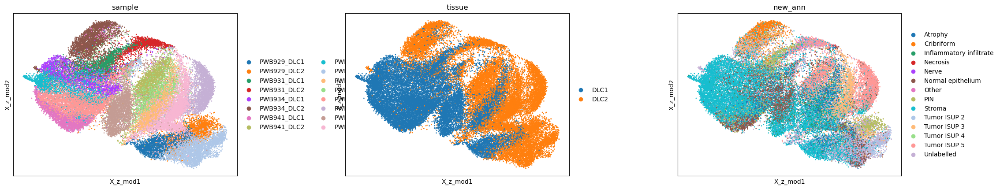

/media/gambino/students_workdir/anna/miniconda3/envs/ak/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/media/gambino/students_workdir/anna/miniconda3/envs/ak/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/media/gambino/students_workdir/anna/miniconda3/envs/ak/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


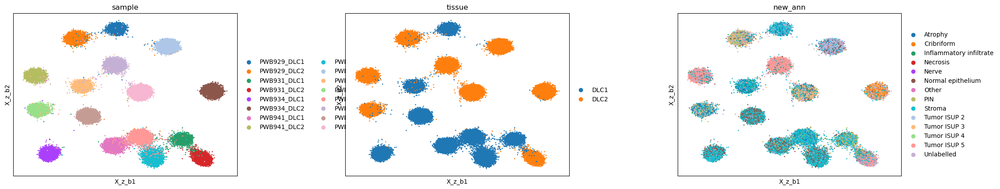

In [25]:
plot_embedding_vaeb(model, msi, train_params=train_params)

In [26]:
## VAEB
train_params = TrainParams(train_size=0.8, test_patience=100, n_epochs=100, learning_rate=1e-4, batch_size=128, 
                           add_lisi_loss=False, params_file="vae_params_vaeb_beta0.1")

model_params = ModelParams(beta=0.1, n_layers=2, z_dim=100, n_hidden=300, use_cuda=True)
torch.set_num_threads(16)
setup_batch_key(msi, ["sample"])
model = VAEB(msi, model_params)

In [27]:
hist = train_vae(model, msi, params=train_params)

/media/gambino/students_workdir/anna/miniconda3/envs/ak/lib/python3.9/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value
/media/gambino/students_workdir/anna/miniconda3/envs/ak/lib/python3.9/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value
100%|█████████████████████████████████████████| 266/266 [00:17<00:00, 15.27it/s]

EarlyStopping (epoch: 1): train loss improved to 0.016146994575533605



100%|███████████████████████████████████████████| 67/67 [00:06<00:00,  9.95it/s]

EarlyStopping (epoch: 1): valid loss improved to 0.9905018637429422



100%|█████████████████████████████████████████| 266/266 [00:17<00:00, 15.39it/s]

EarlyStopping (epoch: 2): train loss improved to 0.005847350680315894



100%|███████████████████████████████████████████| 67/67 [00:06<00:00, 10.12it/s]

EarlyStopping (epoch: 2): valid loss improved to 0.7045286502411117



100%|███████████████████████████████████████████| 67/67 [00:06<00:00, 10.18it/s]

EarlyStopping (epoch: 3): valid loss improved to 0.6065491340053615



100%|███████████████████████████████████████████| 67/67 [00:06<00:00, 10.12it/s]

EarlyStopping (epoch: 4): valid loss improved to 0.5520617703893291



100%|███████████████████████████████████████████| 67/67 [00:06<00:00, 10.40it/s]

EarlyStopping (epoch: 5): valid loss improved to 0.5275324227204964



100%|███████████████████████████████████████████| 67/67 [00:06<00:00, 10.01it/s]

EarlyStopping (epoch: 6): valid loss improved to 0.50559096594355



100%|███████████████████████████████████████████| 67/67 [00:06<00:00, 10.20it/s]

EarlyStopping (epoch: 7): valid loss improved to 0.4931474915191309



100%|███████████████████████████████████████████| 67/67 [00:06<00:00, 10.03it/s]

EarlyStopping (epoch: 9): valid loss improved to 0.4735416529783562



100%|█████████████████████████████████████████| 266/266 [00:17<00:00, 15.48it/s]

EarlyStopping (epoch: 12): train loss hasn't improved: 0.0038117272659846796. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:17<00:00, 15.34it/s]

EarlyStopping (epoch: 13): train loss hasn't improved: 0.0037893523024137474. Stopping.



100%|███████████████████████████████████████████| 67/67 [00:06<00:00, 10.04it/s]

EarlyStopping (epoch: 13): valid loss improved to 0.45868309175790245



100%|█████████████████████████████████████████| 266/266 [00:18<00:00, 14.51it/s]

EarlyStopping (epoch: 14): train loss hasn't improved: 0.003765874896735707. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:18<00:00, 14.69it/s]

EarlyStopping (epoch: 15): train loss hasn't improved: 0.0037419595284767892. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:16<00:00, 15.74it/s]

EarlyStopping (epoch: 16): train loss hasn't improved: 0.00372867371981252. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:17<00:00, 14.80it/s]

EarlyStopping (epoch: 17): train loss hasn't improved: 0.0037116563534161286. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:17<00:00, 14.99it/s]

EarlyStopping (epoch: 18): train loss hasn't improved: 0.003696883874580817. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:17<00:00, 15.49it/s]

EarlyStopping (epoch: 19): train loss hasn't improved: 0.00369122969167523. Stopping.



100%|███████████████████████████████████████████| 67/67 [00:06<00:00,  9.95it/s]

EarlyStopping (epoch: 19): valid loss improved to 0.4461824422451987



100%|█████████████████████████████████████████| 266/266 [00:17<00:00, 15.19it/s]

EarlyStopping (epoch: 20): train loss hasn't improved: 0.0036861317264044405. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:17<00:00, 14.96it/s]

EarlyStopping (epoch: 21): train loss hasn't improved: 0.003669529591082404. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:17<00:00, 15.42it/s]

EarlyStopping (epoch: 22): train loss hasn't improved: 0.0036707597885011155. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:17<00:00, 15.18it/s]

EarlyStopping (epoch: 23): train loss hasn't improved: 0.003661439141994227. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:17<00:00, 15.31it/s]

EarlyStopping (epoch: 24): train loss hasn't improved: 0.0036562674620209054. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:17<00:00, 14.93it/s]

EarlyStopping (epoch: 25): train loss hasn't improved: 0.003651865771267258. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:17<00:00, 15.12it/s]

EarlyStopping (epoch: 26): train loss hasn't improved: 0.0036449314356551865. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:17<00:00, 15.08it/s]

EarlyStopping (epoch: 27): train loss hasn't improved: 0.0036370670649849574. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:16<00:00, 15.68it/s]

EarlyStopping (epoch: 28): train loss hasn't improved: 0.003640090842117907. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:17<00:00, 15.34it/s]

EarlyStopping (epoch: 29): train loss hasn't improved: 0.0036431638448290293. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:17<00:00, 15.08it/s]

EarlyStopping (epoch: 30): train loss hasn't improved: 0.0036372354498605576. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:17<00:00, 15.51it/s]

EarlyStopping (epoch: 31): train loss hasn't improved: 0.003636701283137752. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:17<00:00, 15.17it/s]

EarlyStopping (epoch: 32): train loss hasn't improved: 0.003635826978773282. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:18<00:00, 14.67it/s]

EarlyStopping (epoch: 33): train loss hasn't improved: 0.0036334056093666116. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:18<00:00, 14.33it/s]

EarlyStopping (epoch: 34): train loss hasn't improved: 0.0036349657898864162. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:16<00:00, 15.93it/s]

EarlyStopping (epoch: 35): train loss hasn't improved: 0.0036338641704567183. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:17<00:00, 15.21it/s]

EarlyStopping (epoch: 36): train loss hasn't improved: 0.003634402442673082. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:17<00:00, 15.16it/s]

EarlyStopping (epoch: 37): train loss hasn't improved: 0.0036340187548749093. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:17<00:00, 15.45it/s]

EarlyStopping (epoch: 38): train loss hasn't improved: 0.0036347153223283577. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:17<00:00, 15.18it/s]

EarlyStopping (epoch: 39): train loss hasn't improved: 0.0036351474630194175. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:18<00:00, 14.39it/s]

EarlyStopping (epoch: 40): train loss hasn't improved: 0.003631427343836106. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:18<00:00, 14.66it/s]

EarlyStopping (epoch: 41): train loss hasn't improved: 0.00362990364177989. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:17<00:00, 15.30it/s]

EarlyStopping (epoch: 42): train loss hasn't improved: 0.0036342624656027244. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:18<00:00, 14.48it/s]

EarlyStopping (epoch: 43): train loss hasn't improved: 0.0036323872803238435. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:18<00:00, 14.52it/s]

EarlyStopping (epoch: 44): train loss hasn't improved: 0.00363307738125219. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:18<00:00, 14.74it/s]

EarlyStopping (epoch: 45): train loss hasn't improved: 0.003639184709434442. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:17<00:00, 15.35it/s]

EarlyStopping (epoch: 46): train loss hasn't improved: 0.003635097958537815. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:18<00:00, 14.60it/s]

EarlyStopping (epoch: 47): train loss hasn't improved: 0.0036395953587744783. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:18<00:00, 14.77it/s]

EarlyStopping (epoch: 48): train loss hasn't improved: 0.0036366013392341214. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:17<00:00, 14.90it/s]

EarlyStopping (epoch: 49): train loss hasn't improved: 0.0036418820757105324. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:17<00:00, 15.27it/s]

EarlyStopping (epoch: 50): train loss hasn't improved: 0.003637258293630096. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:17<00:00, 15.04it/s]

EarlyStopping (epoch: 51): train loss hasn't improved: 0.003641022536563761. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:18<00:00, 14.62it/s]

EarlyStopping (epoch: 52): train loss hasn't improved: 0.0036422750892324825. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:17<00:00, 14.97it/s]

EarlyStopping (epoch: 53): train loss hasn't improved: 0.0036458248361339986. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:17<00:00, 15.15it/s]

EarlyStopping (epoch: 54): train loss hasn't improved: 0.003646021763004227. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:17<00:00, 15.30it/s]

EarlyStopping (epoch: 55): train loss hasn't improved: 0.0036432727645115686. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:17<00:00, 14.82it/s]

EarlyStopping (epoch: 56): train loss hasn't improved: 0.0036489812590361622. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:17<00:00, 15.46it/s]

EarlyStopping (epoch: 57): train loss hasn't improved: 0.0036469766976483923. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:18<00:00, 14.69it/s]

EarlyStopping (epoch: 58): train loss hasn't improved: 0.0036488858688010968. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:17<00:00, 14.87it/s]

EarlyStopping (epoch: 59): train loss hasn't improved: 0.0036501050433949767. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:17<00:00, 15.31it/s]

EarlyStopping (epoch: 60): train loss hasn't improved: 0.0036507496400887017. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:18<00:00, 14.61it/s]

EarlyStopping (epoch: 61): train loss hasn't improved: 0.0036504450459702003. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:18<00:00, 14.63it/s]

EarlyStopping (epoch: 62): train loss hasn't improved: 0.003651579071698012. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:17<00:00, 14.85it/s]

EarlyStopping (epoch: 63): train loss hasn't improved: 0.0036530059661985916. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:17<00:00, 15.33it/s]

EarlyStopping (epoch: 64): train loss hasn't improved: 0.003653268685335268. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:18<00:00, 14.63it/s]

EarlyStopping (epoch: 65): train loss hasn't improved: 0.0036559005917486827. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:16<00:00, 15.79it/s]

EarlyStopping (epoch: 66): train loss hasn't improved: 0.0036514508550555794. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:17<00:00, 15.33it/s]

EarlyStopping (epoch: 67): train loss hasn't improved: 0.0036519856462414084. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:17<00:00, 14.98it/s]

EarlyStopping (epoch: 68): train loss hasn't improved: 0.00365247136971893. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:17<00:00, 15.22it/s]

EarlyStopping (epoch: 69): train loss hasn't improved: 0.0036528855562210083. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:17<00:00, 15.33it/s]

EarlyStopping (epoch: 70): train loss hasn't improved: 0.003656787374848966. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:17<00:00, 15.36it/s]

EarlyStopping (epoch: 71): train loss hasn't improved: 0.003652779236128921. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:16<00:00, 15.87it/s]

EarlyStopping (epoch: 72): train loss hasn't improved: 0.003651264405482092. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:17<00:00, 15.38it/s]

EarlyStopping (epoch: 73): train loss hasn't improved: 0.003657021978239651. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:16<00:00, 15.72it/s]

EarlyStopping (epoch: 74): train loss hasn't improved: 0.0036569493861672736. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:17<00:00, 14.89it/s]

EarlyStopping (epoch: 75): train loss hasn't improved: 0.003653530199398638. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:16<00:00, 16.20it/s]

EarlyStopping (epoch: 76): train loss hasn't improved: 0.0036553145033812228. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:17<00:00, 15.60it/s]

EarlyStopping (epoch: 77): train loss hasn't improved: 0.0036592396560523564. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:16<00:00, 16.56it/s]

EarlyStopping (epoch: 78): train loss hasn't improved: 0.0036571765916006507. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:17<00:00, 14.91it/s]

EarlyStopping (epoch: 79): train loss hasn't improved: 0.0036546314916868924. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:17<00:00, 15.57it/s]

EarlyStopping (epoch: 80): train loss hasn't improved: 0.003653262250384139. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:17<00:00, 14.82it/s]

EarlyStopping (epoch: 81): train loss hasn't improved: 0.003653459981513627. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:17<00:00, 15.41it/s]

EarlyStopping (epoch: 82): train loss hasn't improved: 0.003656783548258837. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:17<00:00, 15.33it/s]

EarlyStopping (epoch: 83): train loss hasn't improved: 0.0036578960142253495. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:17<00:00, 15.60it/s]

EarlyStopping (epoch: 84): train loss hasn't improved: 0.003656682997433279. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:16<00:00, 15.65it/s]

EarlyStopping (epoch: 85): train loss hasn't improved: 0.0036573233904033074. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:17<00:00, 15.04it/s]

EarlyStopping (epoch: 86): train loss hasn't improved: 0.003658332798044565. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:17<00:00, 15.19it/s]

EarlyStopping (epoch: 87): train loss hasn't improved: 0.003655745347785276. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:17<00:00, 15.33it/s]

EarlyStopping (epoch: 88): train loss hasn't improved: 0.0036572042416305383. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:16<00:00, 16.30it/s]

EarlyStopping (epoch: 89): train loss hasn't improved: 0.0036581822998247265. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:15<00:00, 16.85it/s]

EarlyStopping (epoch: 90): train loss hasn't improved: 0.0036563708448564395. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:17<00:00, 15.10it/s]

EarlyStopping (epoch: 91): train loss hasn't improved: 0.0036532749518918737. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:18<00:00, 14.53it/s]

EarlyStopping (epoch: 92): train loss hasn't improved: 0.003658592302775369. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:17<00:00, 15.38it/s]

EarlyStopping (epoch: 93): train loss hasn't improved: 0.0036546095425132583. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:17<00:00, 15.09it/s]

EarlyStopping (epoch: 94): train loss hasn't improved: 0.0036507171346833946. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:16<00:00, 16.04it/s]

EarlyStopping (epoch: 95): train loss hasn't improved: 0.003654926257529211. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:17<00:00, 15.49it/s]

EarlyStopping (epoch: 96): train loss hasn't improved: 0.003656232048301854. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:17<00:00, 15.20it/s]

EarlyStopping (epoch: 97): train loss hasn't improved: 0.0036528119230845734. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:17<00:00, 15.03it/s]

EarlyStopping (epoch: 98): train loss hasn't improved: 0.0036564309906440317. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:17<00:00, 15.16it/s]

EarlyStopping (epoch: 99): train loss hasn't improved: 0.003654720061943768. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:16<00:00, 15.92it/s]

EarlyStopping (epoch: 100): train loss hasn't improved: 0.0036544136751252387. Stopping.



100%|███████████████████████████████████████████| 67/67 [00:06<00:00, 10.80it/s]


100%|█████████████████████████████████████████| 332/332 [00:19<00:00, 17.47it/s]
/media/gambino/students_workdir/anna/miniconda3/envs/ak/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/media/gambino/students_workdir/anna/miniconda3/envs/ak/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/media/gambino/students_workdir/anna/miniconda3/envs/ak/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


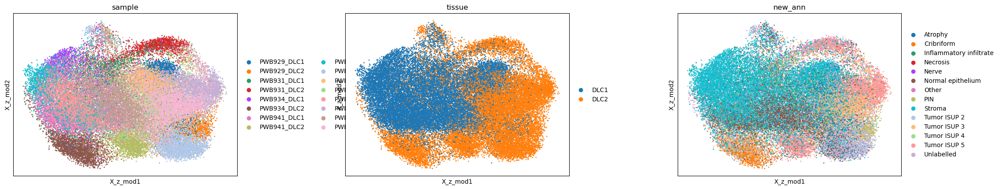

/media/gambino/students_workdir/anna/miniconda3/envs/ak/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/media/gambino/students_workdir/anna/miniconda3/envs/ak/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/media/gambino/students_workdir/anna/miniconda3/envs/ak/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


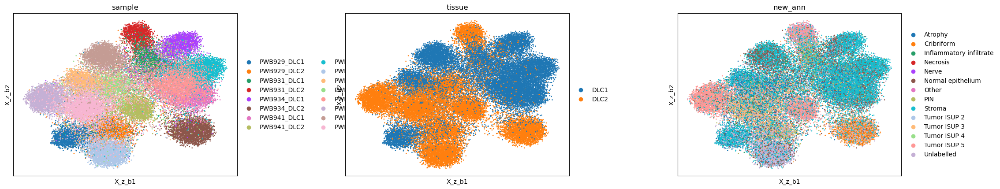

In [28]:
plot_embedding_vaeb(model, msi, train_params=train_params)

In [29]:
## beta for kl_b = 0.01
train_params = TrainParams(train_size=0.8, test_patience=100, n_epochs=100, learning_rate=1e-4, batch_size=128, 
                           add_lisi_loss=False, params_file="vae_params_vaeb_beta0.1_betap0.01")

model_params = ModelParams(beta=0.1, n_layers=2, z_dim=100, n_hidden=300, use_cuda=True)
torch.set_num_threads(16)
setup_batch_key(msi, ["sample"])
model = VAEB(msi, model_params)

In [30]:
hist = train_vae(model, msi, params=train_params)

/media/gambino/students_workdir/anna/miniconda3/envs/ak/lib/python3.9/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value
/media/gambino/students_workdir/anna/miniconda3/envs/ak/lib/python3.9/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value
100%|█████████████████████████████████████████| 266/266 [00:18<00:00, 14.76it/s]

EarlyStopping (epoch: 1): train loss improved to 0.015906133574201755



100%|███████████████████████████████████████████| 67/67 [00:06<00:00, 10.67it/s]

EarlyStopping (epoch: 1): valid loss improved to 0.918623190317581



100%|█████████████████████████████████████████| 266/266 [00:18<00:00, 14.38it/s]

EarlyStopping (epoch: 2): train loss improved to 0.0056442153373137864



100%|███████████████████████████████████████████| 67/67 [00:06<00:00, 10.68it/s]

EarlyStopping (epoch: 2): valid loss improved to 0.6727961960123546



100%|███████████████████████████████████████████| 67/67 [00:06<00:00, 10.40it/s]

EarlyStopping (epoch: 3): valid loss improved to 0.57217643599012



100%|███████████████████████████████████████████| 67/67 [00:06<00:00, 10.51it/s]

EarlyStopping (epoch: 4): valid loss improved to 0.5199377594599083



100%|███████████████████████████████████████████| 67/67 [00:06<00:00, 10.15it/s]

EarlyStopping (epoch: 5): valid loss improved to 0.48474211657225197



100%|███████████████████████████████████████████| 67/67 [00:06<00:00, 10.27it/s]

EarlyStopping (epoch: 6): valid loss improved to 0.46714401111673953



100%|███████████████████████████████████████████| 67/67 [00:06<00:00, 10.69it/s]

EarlyStopping (epoch: 8): valid loss improved to 0.44780506527245934



100%|███████████████████████████████████████████| 67/67 [00:06<00:00, 10.22it/s]

EarlyStopping (epoch: 10): valid loss improved to 0.4372500924032126



100%|█████████████████████████████████████████| 266/266 [00:18<00:00, 14.77it/s]

EarlyStopping (epoch: 12): train loss hasn't improved: 0.0035135076116505196. Stopping.



100%|███████████████████████████████████████████| 67/67 [00:06<00:00, 10.15it/s]

EarlyStopping (epoch: 12): valid loss improved to 0.4264684368425341



100%|█████████████████████████████████████████| 266/266 [00:18<00:00, 14.56it/s]

EarlyStopping (epoch: 13): train loss hasn't improved: 0.003490587605877158. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:18<00:00, 14.66it/s]

EarlyStopping (epoch: 14): train loss hasn't improved: 0.0034762828454612074. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:18<00:00, 14.13it/s]

EarlyStopping (epoch: 15): train loss hasn't improved: 0.003455997694759526. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:17<00:00, 15.10it/s]

EarlyStopping (epoch: 16): train loss hasn't improved: 0.00344585359815712. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:17<00:00, 15.44it/s]

EarlyStopping (epoch: 17): train loss hasn't improved: 0.00343443161252669. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:17<00:00, 15.01it/s]

EarlyStopping (epoch: 18): train loss hasn't improved: 0.003425771939957963. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:17<00:00, 15.31it/s]

EarlyStopping (epoch: 19): train loss hasn't improved: 0.0034205239518310406. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:18<00:00, 14.60it/s]

EarlyStopping (epoch: 20): train loss hasn't improved: 0.0034128800701084664. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:17<00:00, 14.89it/s]

EarlyStopping (epoch: 21): train loss hasn't improved: 0.003406977713143145. Stopping.



100%|███████████████████████████████████████████| 67/67 [00:06<00:00, 10.08it/s]

EarlyStopping (epoch: 21): valid loss improved to 0.41629569032298985



100%|█████████████████████████████████████████| 266/266 [00:17<00:00, 15.04it/s]

EarlyStopping (epoch: 22): train loss hasn't improved: 0.0034053387090765496. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:17<00:00, 14.79it/s]

EarlyStopping (epoch: 23): train loss hasn't improved: 0.0033993922985252594. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:17<00:00, 15.05it/s]

EarlyStopping (epoch: 24): train loss hasn't improved: 0.0033964496130028353. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:17<00:00, 14.78it/s]

EarlyStopping (epoch: 25): train loss hasn't improved: 0.0033969291602603965. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:17<00:00, 15.31it/s]

EarlyStopping (epoch: 26): train loss hasn't improved: 0.00339187312259472. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:17<00:00, 15.08it/s]

EarlyStopping (epoch: 27): train loss hasn't improved: 0.00339649544613301. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:17<00:00, 14.93it/s]

EarlyStopping (epoch: 28): train loss hasn't improved: 0.003395852105381771. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:17<00:00, 14.86it/s]

EarlyStopping (epoch: 29): train loss hasn't improved: 0.003391119720235581. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:17<00:00, 14.85it/s]

EarlyStopping (epoch: 30): train loss hasn't improved: 0.0033925580980147664. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:17<00:00, 15.01it/s]

EarlyStopping (epoch: 31): train loss hasn't improved: 0.003390046859433049. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:18<00:00, 14.61it/s]

EarlyStopping (epoch: 32): train loss hasn't improved: 0.0033878811006338334. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:18<00:00, 14.00it/s]

EarlyStopping (epoch: 33): train loss hasn't improved: 0.003394757740072393. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:18<00:00, 14.54it/s]

EarlyStopping (epoch: 34): train loss hasn't improved: 0.003389021079809684. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:18<00:00, 14.43it/s]

EarlyStopping (epoch: 35): train loss hasn't improved: 0.003390155226571059. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:17<00:00, 15.16it/s]

EarlyStopping (epoch: 36): train loss hasn't improved: 0.003390725333245801. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:18<00:00, 14.62it/s]

EarlyStopping (epoch: 37): train loss hasn't improved: 0.003392766561663944. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:18<00:00, 14.67it/s]

EarlyStopping (epoch: 38): train loss hasn't improved: 0.003389606513017202. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:18<00:00, 14.59it/s]

EarlyStopping (epoch: 39): train loss hasn't improved: 0.0033892449419101315. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:18<00:00, 14.26it/s]

EarlyStopping (epoch: 40): train loss hasn't improved: 0.003394733261472692. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:17<00:00, 15.17it/s]

EarlyStopping (epoch: 41): train loss hasn't improved: 0.003395705109241782. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:18<00:00, 14.50it/s]

EarlyStopping (epoch: 42): train loss hasn't improved: 0.0033946927327699983. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:17<00:00, 15.40it/s]

EarlyStopping (epoch: 43): train loss hasn't improved: 0.003397033368404505. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:19<00:00, 13.91it/s]

EarlyStopping (epoch: 44): train loss hasn't improved: 0.003397317359628503. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:18<00:00, 14.14it/s]

EarlyStopping (epoch: 45): train loss hasn't improved: 0.003399146224134736. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:18<00:00, 14.08it/s]

EarlyStopping (epoch: 46): train loss hasn't improved: 0.003400286305048944. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:18<00:00, 14.74it/s]

EarlyStopping (epoch: 47): train loss hasn't improved: 0.003402563391046148. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:18<00:00, 14.52it/s]

EarlyStopping (epoch: 48): train loss hasn't improved: 0.003403524073907528. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:18<00:00, 14.51it/s]

EarlyStopping (epoch: 49): train loss hasn't improved: 0.0034041982124383622. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:17<00:00, 15.04it/s]

EarlyStopping (epoch: 50): train loss hasn't improved: 0.0034027254006103462. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:17<00:00, 14.89it/s]

EarlyStopping (epoch: 51): train loss hasn't improved: 0.003404500649002035. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:17<00:00, 14.83it/s]

EarlyStopping (epoch: 52): train loss hasn't improved: 0.003405958390397279. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:17<00:00, 14.83it/s]

EarlyStopping (epoch: 53): train loss hasn't improved: 0.003406324357303049. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:17<00:00, 14.94it/s]

EarlyStopping (epoch: 54): train loss hasn't improved: 0.0034083451634999793. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:18<00:00, 14.14it/s]

EarlyStopping (epoch: 55): train loss hasn't improved: 0.0034073841464807176. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:17<00:00, 14.85it/s]

EarlyStopping (epoch: 56): train loss hasn't improved: 0.003408962261017243. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:19<00:00, 13.86it/s]

EarlyStopping (epoch: 57): train loss hasn't improved: 0.0034070134136591186. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:18<00:00, 14.36it/s]

EarlyStopping (epoch: 58): train loss hasn't improved: 0.0034091388481094108. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:19<00:00, 13.83it/s]

EarlyStopping (epoch: 59): train loss hasn't improved: 0.003409153592277794. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:18<00:00, 14.55it/s]

EarlyStopping (epoch: 60): train loss hasn't improved: 0.003414514047773955. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:18<00:00, 14.35it/s]

EarlyStopping (epoch: 61): train loss hasn't improved: 0.003409918997131985. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:18<00:00, 14.11it/s]

EarlyStopping (epoch: 62): train loss hasn't improved: 0.003413068656187467. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:18<00:00, 14.76it/s]

EarlyStopping (epoch: 63): train loss hasn't improved: 0.003415317601881145. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:18<00:00, 14.64it/s]

EarlyStopping (epoch: 64): train loss hasn't improved: 0.003415983917083089. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:18<00:00, 14.03it/s]

EarlyStopping (epoch: 65): train loss hasn't improved: 0.0034126722458322446. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:18<00:00, 14.43it/s]

EarlyStopping (epoch: 66): train loss hasn't improved: 0.003420065263567987. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:17<00:00, 15.37it/s]

EarlyStopping (epoch: 67): train loss hasn't improved: 0.0034179806200597762. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:17<00:00, 14.88it/s]

EarlyStopping (epoch: 68): train loss hasn't improved: 0.0034179345483706935. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:18<00:00, 14.75it/s]

EarlyStopping (epoch: 69): train loss hasn't improved: 0.0034162543350068734. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:18<00:00, 14.77it/s]

EarlyStopping (epoch: 70): train loss hasn't improved: 0.003414519841598019. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:18<00:00, 14.44it/s]

EarlyStopping (epoch: 71): train loss hasn't improved: 0.003414881920519824. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:18<00:00, 14.44it/s]

EarlyStopping (epoch: 72): train loss hasn't improved: 0.0034158799913506285. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:18<00:00, 14.63it/s]

EarlyStopping (epoch: 73): train loss hasn't improved: 0.0034139226269132602. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:18<00:00, 14.42it/s]

EarlyStopping (epoch: 74): train loss hasn't improved: 0.00341466232002869. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:17<00:00, 14.84it/s]

EarlyStopping (epoch: 75): train loss hasn't improved: 0.003416050745151266. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:17<00:00, 15.51it/s]

EarlyStopping (epoch: 76): train loss hasn't improved: 0.003415438957323812. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:17<00:00, 15.63it/s]

EarlyStopping (epoch: 77): train loss hasn't improved: 0.003414629851459685. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:17<00:00, 15.60it/s]

EarlyStopping (epoch: 78): train loss hasn't improved: 0.0034168304644169845. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:17<00:00, 15.11it/s]

EarlyStopping (epoch: 79): train loss hasn't improved: 0.003418608761451187. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:17<00:00, 15.46it/s]

EarlyStopping (epoch: 80): train loss hasn't improved: 0.0034167659473882273. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:17<00:00, 14.86it/s]

EarlyStopping (epoch: 81): train loss hasn't improved: 0.0034153476690740848. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:17<00:00, 15.17it/s]

EarlyStopping (epoch: 82): train loss hasn't improved: 0.0034171590415992196. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:17<00:00, 15.46it/s]

EarlyStopping (epoch: 83): train loss hasn't improved: 0.0034205249262389326. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:18<00:00, 14.71it/s]

EarlyStopping (epoch: 84): train loss hasn't improved: 0.003418958487933071. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:18<00:00, 14.77it/s]

EarlyStopping (epoch: 85): train loss hasn't improved: 0.0034172909409947924. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:16<00:00, 15.97it/s]

EarlyStopping (epoch: 86): train loss hasn't improved: 0.003416051606419088. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:17<00:00, 15.18it/s]

EarlyStopping (epoch: 87): train loss hasn't improved: 0.0034179851219821073. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:18<00:00, 14.64it/s]

EarlyStopping (epoch: 88): train loss hasn't improved: 0.003417806290506685. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:17<00:00, 15.01it/s]

EarlyStopping (epoch: 89): train loss hasn't improved: 0.0034169097940243997. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:17<00:00, 15.10it/s]

EarlyStopping (epoch: 90): train loss hasn't improved: 0.0034197997501346908. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:17<00:00, 15.28it/s]

EarlyStopping (epoch: 91): train loss hasn't improved: 0.0034172580321442736. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:18<00:00, 14.46it/s]

EarlyStopping (epoch: 92): train loss hasn't improved: 0.0034144139258281982. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:17<00:00, 15.25it/s]

EarlyStopping (epoch: 93): train loss hasn't improved: 0.0034165244871830506. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:17<00:00, 14.81it/s]

EarlyStopping (epoch: 94): train loss hasn't improved: 0.0034180104592184657. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:17<00:00, 15.22it/s]

EarlyStopping (epoch: 95): train loss hasn't improved: 0.003414925100559203. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:18<00:00, 14.19it/s]

EarlyStopping (epoch: 96): train loss hasn't improved: 0.0034144188452286182. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:17<00:00, 15.17it/s]

EarlyStopping (epoch: 97): train loss hasn't improved: 0.0034131307183398155. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:17<00:00, 15.34it/s]

EarlyStopping (epoch: 98): train loss hasn't improved: 0.003420574560524647. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:17<00:00, 15.43it/s]

EarlyStopping (epoch: 99): train loss hasn't improved: 0.003415498021702825. Stopping.



100%|█████████████████████████████████████████| 266/266 [00:17<00:00, 15.14it/s]

EarlyStopping (epoch: 100): train loss hasn't improved: 0.0034168488659039186. Stopping.



100%|███████████████████████████████████████████| 67/67 [00:06<00:00, 10.26it/s]


100%|█████████████████████████████████████████| 332/332 [00:19<00:00, 17.23it/s]
/media/gambino/students_workdir/anna/miniconda3/envs/ak/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/media/gambino/students_workdir/anna/miniconda3/envs/ak/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/media/gambino/students_workdir/anna/miniconda3/envs/ak/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


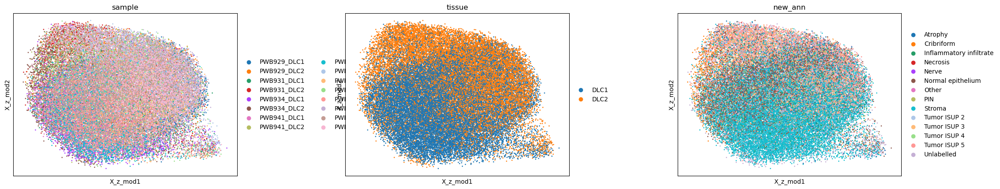

/media/gambino/students_workdir/anna/miniconda3/envs/ak/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/media/gambino/students_workdir/anna/miniconda3/envs/ak/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/media/gambino/students_workdir/anna/miniconda3/envs/ak/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


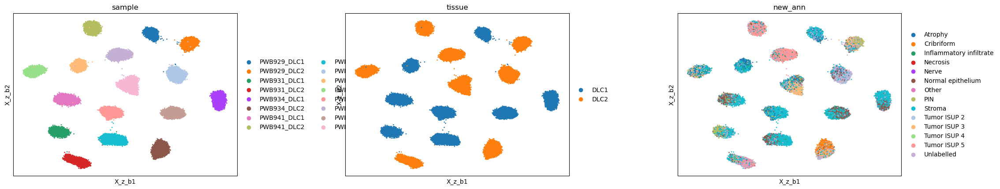

In [31]:
plot_embedding_vaeb(model, msi, train_params=train_params)